In [ ]:
import os

import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import tensorflow as tf
plt.style.use("fivethirtyeight")

In [ ]:
ROOT="/content/drive/MyDrive/Colab Notebooks/StreetTreeCensus"
os.chdir(ROOT)
os.getcwd()

'/content/drive/MyDrive/Colab Notebooks/StreetTreeCensus'

In [ ]:
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

In [ ]:
# "Column Name",Description
# tree_id,"Unique identification number for each tree point."
# block_id,"Identifier linking each tree to the block in the blockface table/shapefile that it is mapped on."
# created_at,"The date tree points were collected in the census software."
# tree_dbh,"Diameter of the tree, measured at approximately 54"" / 137cm above the ground. Data was collected for both living and dead trees; for stumps, use stump_diam"
# stump_diam,"Diameter of stump measured through the center, rounded to the nearest inch."
# curb_loc,"Location of tree bed in relationship to the curb; trees are either along the curb (OnCurb) or offset from the curb (OffsetFromCurb)"
# status,"Indicates whether the tree is alive, standing dead, or a stump."
# health,"Indicates the user's perception of tree health."
# spc_latin,"Scientific name for species, e.g. ""Acer rubrum"""
# spc_common,"Common name for species, e.g. ""red maple"""
# steward,"Indicates the number of unique signs of stewardship observed for this tree. Not recorded for stumps or dead trees."
# guards,"Indicates whether a guard is present, and if the user felt it was a helpful or harmful guard. Not recorded for dead trees and stumps."
# sidewalk,"Indicates whether one of the sidewalk flags immediately adjacent to the tree was damaged, cracked, or lifted. Not recorded for dead trees and stumps."
# user_type,"This field describes the category of user who collected this tree point's data."
# problems,""
# root_stone,"Indicates the presence of a root problem caused by paving stones in tree bed"
# root_grate,"Indicates the presence of a root problem caused by metal grates in tree bed"
# root_other,"Indicates the presence of other root problems"
# trunk_wire,"Indicates the presence of a trunk problem caused by wires or rope wrapped around the trunk"
# trnk_light,"Indicates the presence of a trunk problem caused by lighting installed on the tree"
# trnk_other,"Indicates the presence of other trunk problems"
# brch_light,"Indicates the presence of a branch problem caused by lights (usually string lights) or wires in the branches"
# brch_shoe,"Indicates the presence of a branch problem caused by sneakers in the branches"
# brch_other,"Indicates the presence of other branch problems"
# address,"Nearest estimated address to tree"
# postcode,"Five-digit zipcode in which tree is located"
# zip_city,"City as derived from zipcode. This is often (but not always) the same as borough."
# "community board","Community board in which tree point is located"
# borocode,"Code for borough in which tree point is located: 1 (Manhattan), 2 (Bronx), 3 (Brooklyn), 4 (Queens), 5 (Staten Island)"
# borough,"Name of borough in which tree point is located"
# cncldist,"Council district in which tree point is located"
# st_assem,"State Assembly District in which tree point is located"
# st_senate,"State Senate District in which tree point is located"
# nta,"This is the NTA Code corresponding to the neighborhood tabulation area from the 2010 US Census that the tree point falls into."
# nta_name,"This is the NTA name corresponding to the neighborhood tabulation area from the 2010 US Census that the tree point falls into."
# boro_ct,"This is the boro_ct identifyer for the census tract that the tree point falls into."
# state,"All features given value 'New York'"
# latitude,"Latitude of point, in decimal degrees"
# longitude,"Longitude of point, in decimal degrees"
# x_sp,"X coordinate, in state plane. Units are feet."
# y_sp,"Y coordinate, in state plane. Units are feet"
# "council district",""
# "census tract",""
# bin,""
# bbl,""

In [ ]:
df = pd.read_csv("2015_Street_Tree_Census_-_Tree_Data.csv")
df.head(10)

,tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,steward,guards,sidewalk,user_type,problems,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,address,postcode,zip_city,community board,borocode,borough,cncldist,st_assem,st_senate,nta,nta_name,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
0,180683,348711,08/27/2015,3,0,OnCurb,Alive,Fair,Acer rubrum,red maple,None,None,NoDamage,TreesCount Staff,None,No,No,No,No,No,No,No,No,No,108-005 70 AVENUE,11375,Forest Hills,406,4,Queens,29,28.0,16.0,QN17,Forest Hills,4073900.0,New York,40.723092,-73.844215,1.027431e+06,202756.7687,29.0,739.0,4052307.0,4.022210e+09
1,200540,315986,09/03/2015,21,0,OnCurb,Alive,Fair,Quercus palustris,pin oak,None,None,Damage,TreesCount Staff,Stones,Yes,No,No,No,No,No,No,No,No,147-074 7 AVENUE,11357,Whitestone,407,4,Queens,19,27.0,11.0,QN49,Whitestone,4097300.0,New York,40.794111,-73.818679,1.034456e+06,228644.8374,19.0,973.0,4101931.0,4.044750e+09
2,204026,218365,09/05/2015,3,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,1or2,None,Damage,Volunteer,None,No,No,No,No,No,No,No,No,No,390 MORGAN AVENUE,11211,Brooklyn,301,3,Brooklyn,34,50.0,18.0,BK90,East Williamsburg,3044900.0,New York,40.717581,-73.936608,1.001823e+06,200716.8913,34.0,449.0,3338310.0,3.028870e+09
3,204337,217969,09/05/2015,10,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,None,None,Damage,Volunteer,Stones,Yes,No,No,No,No,No,No,No,No,1027 GRAND STREET,11211,Brooklyn,301,3,Brooklyn,34,53.0,18.0,BK90,East Williamsburg,3044900.0,New York,40.713537,-73.934456,1.002420e+06,199244.2531,34.0,449.0,3338342.0,3.029250e+09
4,189565,223043,08/30/2015,21,0,OnCurb,Alive,Good,Tilia americana,American linden,None,None,Damage,Volunteer,Stones,Yes,No,No,No,No,No,No,No,No,603 6 STREET,11215,Brooklyn,306,3,Brooklyn,39,44.0,21.0,BK37,Park Slope-Gowanus,3016500.0,New York,40.666778,-73.975979,9.909138e+05,182202.4260,39.0,165.0,3025654.0,3.010850e+09
5,190422,106099,08/30/2015,11,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,1or2,Helpful,NoDamage,Volunteer,None,No,No,No,No,No,No,No,No,No,8 COLUMBUS AVENUE,10023,New York,107,1,Manhattan,3,67.0,27.0,MN14,Lincoln Square,1014500.0,New York,40.770046,-73.984950,9.884187e+05,219825.5227,3.0,145.0,1076229.0,1.011310e+09
6,190426,106099,08/30/2015,11,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,1or2,Helpful,NoDamage,Volunteer,None,No,No,No,No,No,No,No,No,No,120 WEST 60 STREET,10023,New York,107,1,Manhattan,3,67.0,27.0,MN14,Lincoln Square,1014500.0,New York,40.770210,-73.985338,9.883112e+05,219885.2785,3.0,145.0,1076229.0,1.011310e+09
7,208649,103940,09/07/2015,9,0,OnCurb,Alive,Good,Tilia americana,American linden,None,None,NoDamage,Volunteer,MetalGrates,No,Yes,No,No,No,No,No,No,No,311 WEST 50 STREET,10019,New York,104,1,Manhattan,3,75.0,27.0,MN15,Clinton,1012700.0,New York,40.762724,-73.987297,9.877691e+05,217157.8561,3.0,133.0,1086093.0,1.010410e+09
8,209610,407443,09/08/2015,6,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,None,None,NoDamage,TreesCount Staff,None,No,No,No,No,No,No,No,No,No,65 JEROME AVENUE,10305,Staten Island,502,5,Staten Island,50,64.0,23.0,SI14,Grasmere-Arrochar-Ft. Wadsworth,5006400.0,New York,40.596579,-74.076255,9.630732e+05,156635.5542,NaN,NaN,NaN,NaN
9,192755,207508,08/31/2015,21,0,OffsetFromCurb,Alive,Fair,Platanus x acerifolia,London planetree,None,None,NoDamage,TreesCount Staff,None,No,No,No,No,No,No,No,No,No,638 AVENUE Z,11223,Brooklyn,313,3,Brooklyn,47,45.0,23.0,BK26,Gravesend,3037402.0,New York,40.586357,-73.969744,9.926537e+05,152903.6306,47.0,37402.0,3320727.0,3.072350e+09


In [ ]:
df.columns

Index(['tree_id', 'block_id', 'created_at', 'tree_dbh', 'stump_diam',
       'curb_loc', 'status', 'health', 'spc_latin', 'spc_common', 'steward',
       'guards', 'sidewalk', 'user_type', 'problems', 'root_stone',
       'root_grate', 'root_other', 'trunk_wire', 'trnk_light', 'trnk_other',
       'brch_light', 'brch_shoe', 'brch_other', 'address', 'postcode',
       'zip_city', 'community board', 'borocode', 'borough', 'cncldist',
       'st_assem', 'st_senate', 'nta', 'nta_name', 'boro_ct', 'state',
       'latitude', 'longitude', 'x_sp', 'y_sp', 'council district',
       'census tract', 'bin', 'bbl'],
      dtype='object')

In [ ]:
df1 = df[['tree_id', 'created_at', 'tree_dbh', 'stump_diam',
       'curb_loc', 'status', 'health', 'spc_latin', 'spc_common', 'steward',
       'sidewalk', 'user_type',  'root_stone', 'root_grate', 'root_other', 
       'trunk_wire', 'trnk_light', 'trnk_other', 'brch_light', 'brch_shoe',]]

In [ ]:
df1.head()

,tree_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,steward,sidewalk,user_type,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe
0,180683,08/27/2015,3,0,OnCurb,Alive,Fair,Acer rubrum,red maple,None,NoDamage,TreesCount Staff,No,No,No,No,No,No,No,No
1,200540,09/03/2015,21,0,OnCurb,Alive,Fair,Quercus palustris,pin oak,None,Damage,TreesCount Staff,Yes,No,No,No,No,No,No,No
2,204026,09/05/2015,3,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,1or2,Damage,Volunteer,No,No,No,No,No,No,No,No
3,204337,09/05/2015,10,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,None,Damage,Volunteer,Yes,No,No,No,No,No,No,No
4,189565,08/30/2015,21,0,OnCurb,Alive,Good,Tilia americana,American linden,None,Damage,Volunteer,Yes,No,No,No,No,No,No,No


In [ ]:
df1.isna().sum()

created_at       0
tree_dbh         0
stump_diam       0
curb_loc         0
status           0
health        7455
spc_latin     7454
spc_common    7454
steward       7454
sidewalk      7454
user_type        0
root_stone       0
root_grate       0
root_other       0
trunk_wire       0
trnk_light       0
trnk_other       0
brch_light       0
brch_shoe        0
dtype: int64

In [ ]:
df1[df1['health'].isna()]

,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,steward,sidewalk,user_type,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe
37,09/09/2015,0,16,OnCurb,Stump,NaN,NaN,NaN,NaN,NaN,TreesCount Staff,No,No,No,No,No,No,No,No
57,08/29/2015,0,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
196,09/07/2015,10,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
209,09/08/2015,6,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,TreesCount Staff,No,No,No,No,No,No,No,No
239,09/04/2015,0,15,OnCurb,Stump,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
266,09/08/2015,6,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
285,08/30/2015,9,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
430,08/30/2015,7,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
438,08/30/2015,4,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
591,08/27/2015,20,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,TreesCount Staff,No,No,No,No,No,No,No,No


In [ ]:
df1.describe()

,tree_id,tree_dbh,stump_diam
count,146505.000000,146505.000000,146505.000000
mean,257541.245766,11.228579,0.481069
std,53998.063850,8.557373,3.480857
min,7.000000,0.000000,0.000000
25%,220005.000000,5.000000,0.000000
50%,259450.000000,9.000000,0.000000
75%,299297.000000,16.000000,0.000000
max,413793.000000,425.000000,140.000000


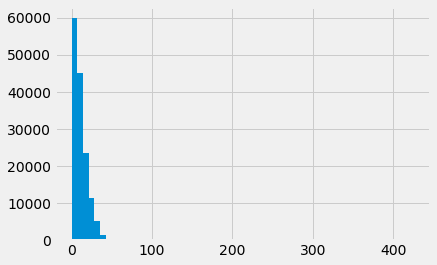

In [ ]:
df1['tree_dbh'].hist(bins=60)

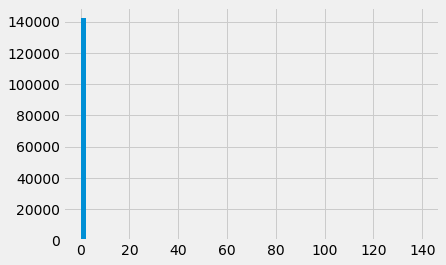

In [ ]:
df1['tree_dbh'].hist(bins=60)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff463cc4210>,
      dtype=object)

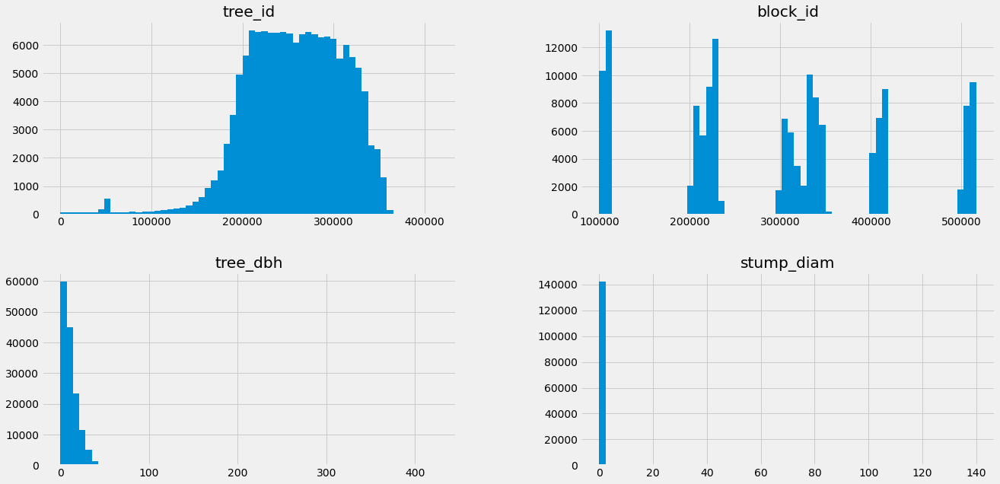

In [ ]:
df1.hist(bins=60,figsize=(20,10))

In [ ]:
big_trees1 = df1[df1['tree_dbh']>50]
big_trees2 = df1[df1['stump_diam']>50]

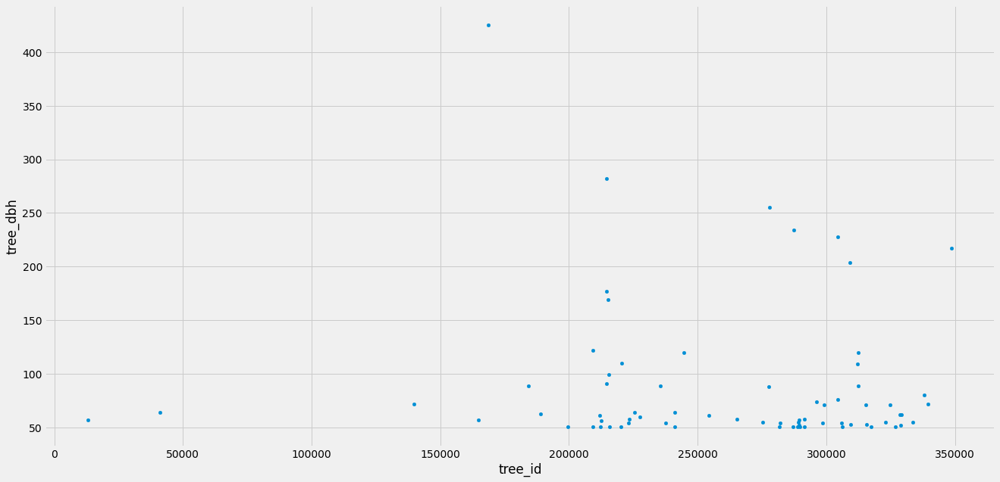

In [ ]:
big_trees1[['tree_id','tree_dbh']].plot(kind='scatter', x='tree_id',y='tree_dbh', figsize=(20,10),);

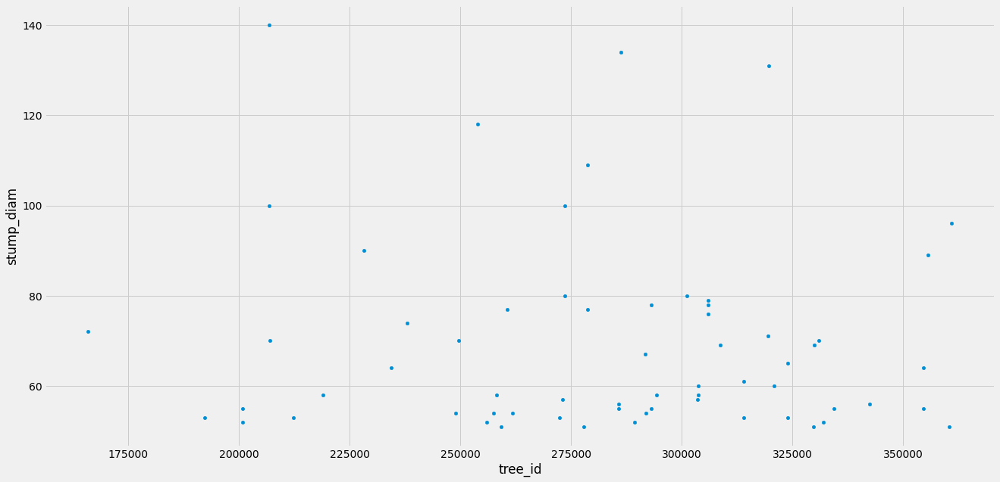

In [ ]:
big_trees2[['tree_id','stump_diam']].plot(kind='scatter', x='tree_id',y='stump_diam', figsize=(20,10),);

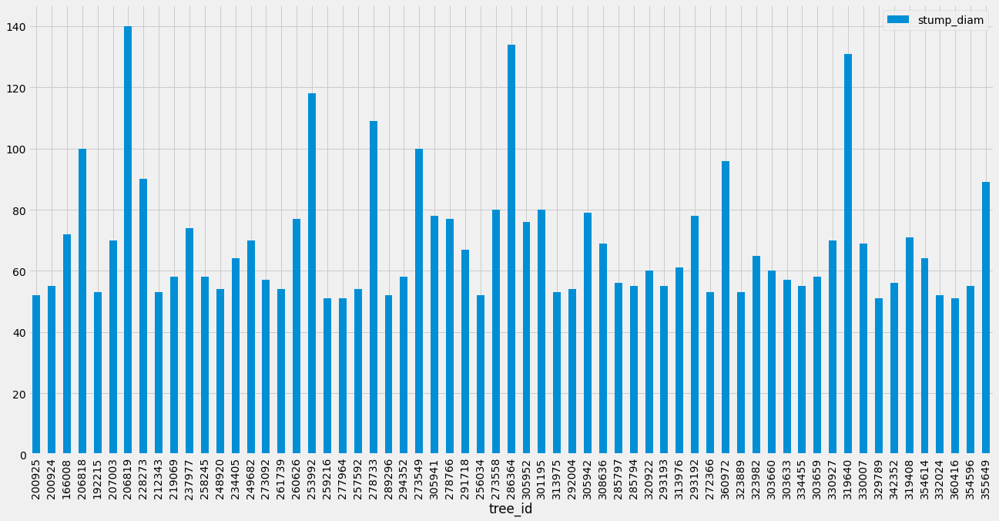

In [ ]:
big_trees2[['tree_id','stump_diam']].plot(kind='bar', x='tree_id',y='stump_diam', figsize=(20,10),);

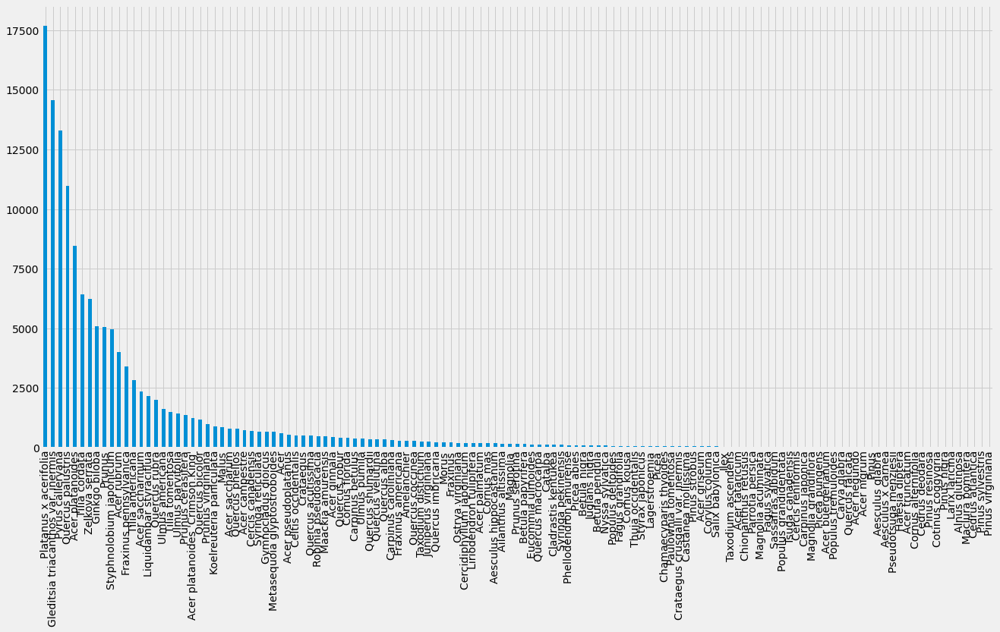

In [ ]:
(df1['spc_latin'].value_counts()).plot(kind='bar',figsize=(20,10))
# x = df1['spc_common'].value_counts()

In [ ]:
df1['spc_latin'].value_counts()

In [ ]:
df2 = df1[['root_stone', 'root_grate', 'root_other', 
       'trunk_wire', 'trnk_light', 'trnk_other', 'brch_light', 'brch_shoe',]]
df2.head()

,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe
0,No,No,No,No,No,No,No,No
1,Yes,No,No,No,No,No,No,No
2,No,No,No,No,No,No,No,No
3,Yes,No,No,No,No,No,No,No
4,Yes,No,No,No,No,No,No,No


In [ ]:
df2.apply(pd.Series.value_counts)

,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe
No,112729,145244,138253,143449,146212,138362,131731,146413
Yes,33776,1261,8252,3056,293,8143,14774,92


In [ ]:
df1[df1['status']!='Alive']

,tree_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,steward,sidewalk,user_type,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe
37,211205,09/09/2015,0,16,OnCurb,Stump,NaN,NaN,NaN,NaN,NaN,TreesCount Staff,No,No,No,No,No,No,No,No
57,187807,08/29/2015,0,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
196,208322,09/07/2015,10,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
209,209058,09/08/2015,6,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,TreesCount Staff,No,No,No,No,No,No,No,No
239,203597,09/04/2015,0,15,OnCurb,Stump,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
266,210544,09/08/2015,6,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
285,188609,08/30/2015,9,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
430,189412,08/30/2015,7,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
438,189526,08/30/2015,4,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,Volunteer,No,No,No,No,No,No,No,No
591,179748,08/27/2015,20,0,OnCurb,Dead,NaN,NaN,NaN,NaN,NaN,TreesCount Staff,No,No,No,No,No,No,No,No


In [ ]:
(df1[df1['status']!='Alive']).count()

tree_id       7454
created_at    7454
tree_dbh      7454
stump_diam    7454
curb_loc      7454
status        7454
health           0
spc_latin        0
spc_common       0
steward          0
sidewalk         0
user_type     7454
root_stone    7454
root_grate    7454
root_other    7454
trunk_wire    7454
trnk_light    7454
trnk_other    7454
brch_light    7454
brch_shoe     7454
dtype: int64

In [ ]:
mask = [(df1['status']=='Stump') | (df1['status'] == 'Dead')]
mask

In [ ]:
# df1.loc[mask] = df1.loc[mask].fillna('Not applicable')

In [ ]:
df1.groupby('spc_latin').mean()

,tree_id,tree_dbh,stump_diam
spc_latin,,,
Acer,246653.140777,11.166667,0.0
Acer buergerianum,239089.571429,7.928571,0.0
Acer campestre,278609.247566,7.054242,0.0
Acer ginnala,281640.015909,8.320455,0.0
Acer griseum,136973.920000,4.740000,0.0
Acer negundo,253472.700000,11.600000,0.0
Acer nigrum,161541.333333,11.111111,0.0
Acer palmatum,174849.717277,6.246073,0.0
Acer platanoides,250141.896649,14.361963,0.0


In [ ]:
df1.groupby('spc_latin').describe()

tree_id                                \
                                      count           mean            std   
spc_latin                                                                   
Acer                                  618.0  246653.140777   62108.361812   
Acer buergerianum                      28.0  239089.571429   75739.032950   
Acer campestre                        719.0  278609.247566   44564.610058   
Acer ginnala                          440.0  281640.015909   45149.684358   
Acer griseum                           50.0  136973.920000   64358.251387   
Acer negundo                           20.0  253472.700000   43299.529115   
Acer nigrum                            18.0  161541.333333   67351.451594   
Acer palmatum                         191.0  174849.717277   77359.179406   
Acer platanoides                     8476.0  250141.896649   47975.194676   
Acer platanoides 'Crimson King'      1228.0  236925.120521   52791.480215   
Acer pseudoplatanus                   533.0  267081.392120   47449.656800   
Acer rubrum                          4003.0  277731.885836   49573.349789   
Acer saccharinum                     2367.0  239965.375158   52728.545274   
Acer saccharum                        794.0  272729.341310   51629.590140   
Acer tataricum                         42.0  277944.071429   40678.740503   
Acer truncatum                         14.0  262942.357143   24127.781165   
Aesculus glabra                        17.0  264698.764706   62758.074449   
Aesculus hippocastanum                173.0  253040.780347   49106.952894   
Aesculus x carnea                      16.0  108797.062500   71066.078719   
Ailanthus altissima                   169.0  264278.372781   40546.709122   
Alnus glutinosa                         9.0  199300.222222   89299.819687   
Amelanchier                           280.0  146375.307143   76489.301029   
Betula nigra                           96.0  248647.062500   42333.137693   
Betula papyrifera                     141.0  174285.078014   77199.980800   
Betula pendula                         79.0   99157.443038   53979.630239   
Carpinus betulus                      375.0  176151.277333   79201.418826   
Carpinus caroliniana                  309.0   98121.783172   74510.279829   
Carpinus japonica                      31.0  114221.774194   83012.933746   
Carya glabra                           25.0  249463.920000   52194.115573   
Castanea mollissima                    52.0  149604.134615   60421.185035   
Catalpa                               122.0  234023.721311   48720.286731   
Cedrus atlantica                        5.0  180060.200000   45689.734139   
Cedrus deodara                         11.0  223305.818182   35988.200883   
Celtis occidentalis                   503.0  243496.385686   57390.299968   
Cercidiphyllum japonicum              195.0  272084.625641   42624.891753   
Cercis canadensis                     707.0  255629.953324   52962.253225   
Cercis reniformis                      34.0  241549.647059   51756.880610   
Chamaecyparis thyoides                 57.0  278303.561404   51367.244013   
Chionanthus retusus                    41.0  237042.682927   46932.175753   
Cladrastis kentukea                   115.0  247581.904348   53306.131865   
Cornus alternifolia                    14.0   87782.357143   95245.244852   
Cornus florida                        413.0  244213.171913   51066.849230   
Cornus kousa                           67.0  260567.149254   42713.557766   
Cornus mas                            186.0  228763.849462   55246.217532   
Corylus colurna                        47.0  235617.829787   51820.381363   
Cotinus coggygria                       9.0  108004.444444   80643.902009   
Crataegus                             495.0  224287.836364   54713.933862   
Crataegus crusgalli var. inermis       55.0  275046.527273   55725.656123   
Eucommia ulmoides                     136.0  186776.551471   59448.580078   
Fagus grandifolia               

In [ ]:
df1.groupby('spc_latin')['tree_dbh'].describe()

,count,mean,std,min,25%,50%,75%,max
spc_latin,,,,,,,,
Acer,618.0,11.166667,6.569394,0.0,6.00,10.0,15.00,44.0
Acer buergerianum,28.0,7.928571,3.321407,2.0,6.00,8.0,9.25,18.0
Acer campestre,719.0,7.054242,3.979209,1.0,4.00,6.0,9.00,33.0
Acer ginnala,440.0,8.320455,4.908692,2.0,5.00,8.0,10.25,36.0
Acer griseum,50.0,4.740000,5.086236,1.0,2.00,3.0,4.75,28.0
Acer negundo,20.0,11.600000,8.822221,3.0,5.00,8.5,15.50,35.0
Acer nigrum,18.0,11.111111,9.247505,2.0,5.00,6.0,16.00,33.0
Acer palmatum,191.0,6.246073,5.121387,1.0,2.50,5.0,9.00,34.0
Acer platanoides,8476.0,14.361963,5.849332,0.0,10.00,14.0,18.00,110.0


In [ ]:
stat = df1.groupby('spc_latin')['tree_dbh'].describe().reset_index()
stat.head()

,spc_latin,count,mean,std,min,25%,50%,75%,max
0,Acer,618.0,11.166667,6.569394,0.0,6.0,10.0,15.00,44.0
1,Acer buergerianum,28.0,7.928571,3.321407,2.0,6.0,8.0,9.25,18.0
2,Acer campestre,719.0,7.054242,3.979209,1.0,4.0,6.0,9.00,33.0
3,Acer ginnala,440.0,8.320455,4.908692,2.0,5.0,8.0,10.25,36.0
4,Acer griseum,50.0,4.740000,5.086236,1.0,2.0,3.0,4.75,28.0


In [ ]:
stat = df1.groupby('spc_latin')['tree_dbh'].describe().reset_index()[['spc_latin', '25%', '75%']]
stat.head()

,spc_latin,25%,75%
0,Acer,6.0,15.00
1,Acer buergerianum,6.0,9.25
2,Acer campestre,4.0,9.00
3,Acer ginnala,5.0,10.25
4,Acer griseum,2.0,4.75
